# Практика Auto ML 

YData_Profiling

Hyperopt

## Библиотеки

In [1]:
import ydata_profiling
from ydata_profiling import ProfileReport
from ydata_profiling.utils.cache import cache_zipped_file

from pathlib import Path
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.impute import SimpleImputer
from sklearn.model_selection import cross_val_score
import shap
from hyperopt import fmin, tpe, hp, Trials
from hyperopt import space_eval

%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

## Блок функций

In [2]:
def dataloader(path: str) -> pd.DataFrame:
    """takes in a test/train data path and returns a processed dataframe"""
    df = pd.read_csv(path)
    df = (df
          .astype(DTYPE)
          # one-hot-encoding gender
          .replace({"Gender":{"Male":0, "Female":1}})
          .astype({"Gender":np.int8})
          # round age and convert to int
          .assign(age=lambda d: d['Age'].round(0).astype(int))
         )
    return df




def add_new_features(df):
    df['AgeGroup'] = df['Age'] // 10 * 10
    #df['IsSenior'] = df['Age'].apply(lambda x: 1 if x >= 65 else 0)
    df['Balance_to_Salary_Ratio'] = df['Balance'] / df['EstimatedSalary']
    df['CreditScoreTier'] = pd.cut(df['CreditScore'], bins=[0, 650, 750, 850], labels=['0', '1', '2'])
    df['IsActive_by_CreditCard'] = df['HasCrCard'] * df['IsActiveMember']
    df['Customer_Status'] = df['Tenure'].apply(lambda x:0 if x < 2 else 1)
    return df





def objective(params):
  model = Pipeline(steps=[
        ("preprocessor", preprocessor),
        ("classifier", RandomForestClassifier(**params,
                                              random_state=42))
    ])

  accuracy = cross_val_score(model, X_train, y_train, cv=3, scoring='accuracy').mean()
  return -1*accuracy # минимизируем ОТРИЦАТЕЛЬНУЮ F которую хотим МАКСИмизировать



## Загрузка данных

In [3]:
DTYPE = {
    "id":np.int64,
    "CustomerId":np.int64,
    "CreditScore":np.int64,
    "Tenure":np.int8,
    "Balance":np.float64,
    "NumOfProducts":np.int8,
    "HasCrCard":np.int8,
    "IsActiveMember":np.int8,
    "EstimatedSalary":np.float64,
}


In [4]:
## reload data
df_train = dataloader('data/train.csv')
df_test = dataloader('data/test.csv')

## EDA YData_Profiling

In [5]:
# Генерация профильного отчета
profile = ProfileReport(
        df_train, title="Profile Report of the UCI Bank Marketing Dataset", explorative=True
    )

In [6]:
# Интерфейс виджетов для блокнота
profile.to_widgets()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
df_train=add_new_features(df_train)
df_test=add_new_features(df_test)

In [8]:
col_to_drop = ['id', 'age', 'Surname', 'Age', 'Balance', 'EstimatedSalary', 'CreditScore', 'HasCrCard', 'IsActiveMember', 'Tenure']

In [9]:
df_train = df_train.drop(col_to_drop, axis=1)
df_test = df_test.drop(col_to_drop, axis=1)

In [10]:
print(df_train['Exited'].value_counts())
df_train.drop_duplicates()
df_train['Exited'].value_counts()

Exited
0    130113
1     34921
Name: count, dtype: int64


Exited
0    130113
1     34921
Name: count, dtype: int64

In [11]:
# Генерация профильного отчета
profile_new = ProfileReport(
        df_train, title="Profile Report of the UCI Bank Marketing Dataset", explorative=True
    )

profile_new

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
df_train.dtypes

CustomerId                    int64
Geography                    object
Gender                         int8
NumOfProducts                  int8
Exited                        int64
AgeGroup                    float64
Balance_to_Salary_Ratio     float64
CreditScoreTier            category
IsActive_by_CreditCard         int8
Customer_Status               int64
dtype: object

In [13]:
for i in df_train.columns:
    print(df_train[i].value_counts())

CustomerId
15682355    121
15570194     99
15585835     98
15595588     91
15648067     90
           ... 
15635203      1
15806982      1
15691104      1
15624936      1
15815050      1
Name: count, Length: 23221, dtype: int64
Geography
France     94215
Spain      36213
Germany    34606
Name: count, dtype: int64
Gender
0    93150
1    71884
Name: count, dtype: int64
NumOfProducts
2    84291
1    77374
3     2894
4      475
Name: count, dtype: int64
Exited
0    130113
1     34921
Name: count, dtype: int64
AgeGroup
30.0    81253
40.0    43319
20.0    23202
50.0    12186
60.0     3920
70.0      763
10.0      332
80.0       48
90.0       11
Name: count, dtype: int64
Balance_to_Salary_Ratio
0.000000    89648
2.065449       25
2.139996       22
1.410807       21
0.563815       18
            ...  
0.882768        1
2.302652        1
0.848419        1
0.920811        1
2.269582        1
Name: count, Length: 63493, dtype: int64
CreditScoreTier
0    75549
1    71146
2    18339
Name: count, dty

## Моделирование и подбор гиперпараметров Hyperopt

In [14]:
# Разделение данных на признаки и целевую переменную
y = df_train['Exited']
X = df_train.drop('Exited', axis=1)

In [15]:
# Разделение данных на обучающий и тестовый наборы
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [16]:
# разделение признаков на категориальные и непрерывные
num_features = [col for col in X.columns if len(X[col].value_counts()) > 5]
cat_features = [col for col in X.columns if len(X[col].value_counts()) <= 5]

In [17]:
# Непрерывные признаки
num_pipeline = Pipeline(steps=[
    # ('imputer',SimpleImputer(strategy="constant")),
    ('std_scaler', StandardScaler()),
])

# Категориальные признаки
cat_pipeline = Pipeline(steps=[
    ("onehot", OneHotEncoder(handle_unknown='ignore'))
])

In [18]:
preprocessor = ColumnTransformer(transformers=[
    ("num", num_pipeline, num_features),
    ("cat", cat_pipeline, cat_features)
])

In [19]:
# обучим дефолтную модель
rf_baseline = Pipeline(steps=[("preprocessor",preprocessor),
                        ("model", RandomForestClassifier(random_state=42))
                       ])
rf_baseline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('std_scaler',
                                                                   StandardScaler())]),
                                                  ['CustomerId', 'AgeGroup',
                                                   'Balance_to_Salary_Ratio']),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Geography', 'Gender',
                                                   'NumOfProducts',
                                                   'CreditScoreTier',
                                                   'IsActive_by_CreditCard',
                                                   'Customer_Status'])])),
                ('model', RandomForestClassifier(random_state=42))])

In [20]:
# Получаем предсказания на тестовом наборе данных
y_pred = rf_baseline.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8217
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.90      0.89     39133
           1       0.59      0.51      0.54     10378

    accuracy                           0.82     49511
   macro avg       0.73      0.71      0.72     49511
weighted avg       0.81      0.82      0.82     49511



## Hyperopt

*   Objective function — функция, которую мы хотим минимизировать.
*   Domain space (param_space) — пространство значений гиперпараметров, в котором мы будем искать минимальное значение функции.

*   Hyperparameter optimization function — суррогатная функция для выбора следующих значений для вычислений.

*   Trials — объект хранения очков, пар параметров, записанных для каждого измерения функции минимизации.

    n_estimators: Использование диапазона от 10 до 200 позволяет исследовать количество деревьев, что влияет на стабильность и точность модели.
    max_features: Включение различных стратегий (sqrt, log2) и числового диапазона позволяет проверить, как разные подходы к выбору признаков могут повлиять на качество модели.
    max_depth: Добавление None позволяет деревьям расти до максимальной глубины, что полезно для оценки переобучения.
    min_samples_split и min_samples_leaf: Эти параметры помогают контролировать сложность дерева. Более высокие значения могут предотвратить переобучение, поэтому использование диапазона от 1 до 20 разумно.
    bootstrap: Проверка, улучшает ли использование бутстрэппинга качество модели.

In [21]:
# определяем пространство гиперпараметров
param_space = {
    'n_estimators': hp.choice('n_estimators', list(range(10, 201, 10))),
    'max_features': hp.choice('max_features', ['sqrt', 'log2'] + list(range(1, X_train.shape[1] + 1))),
    'max_depth': hp.choice('max_depth', [None] + list(range(1, 31))),
    'min_samples_split': hp.randint('min_samples_split', 2, 20),
    'min_samples_leaf': hp.randint('min_samples_leaf', 1, 20),
    'bootstrap': hp.choice('bootstrap', [True, False]),
}

    n_estimators:
        Выбор: hp.choice('n_estimators', list(range(10, 201, 10)))
        Обоснование: Параметр n_estimators определяет количество деревьев в ансамбле (например, при использовании Random Forest или Gradient Boosting). В зависимости от сложности задачи, количества обучающих примеров и признаков, оптимальное количество деревьев может варьироваться. Диапазон от 10 до 200 позволяет найти баланс между переобучением и недообучением, а также учитывает время обучения.

    max_features:
        Выбор: hp.choice('max_features', ['sqrt', 'log2'] + list(range(1, X_train.shape[1] + 1)))
        Обоснование: max_features определяет, сколько признаков будет случайно выбрано для обучения каждого дерева. Использование 'sqrt' и 'log2' — это стандартные подходы, которые часто хорошо работают в практике. Также добавление целого числа от 1 до числа признаков позволяет исследовать более детализированные настройки, что может быть полезно для улучшения качества модели.

    max_depth:
        Выбор: hp.choice('max_depth', [None] + list(range(1, 31)))
        Обоснование: Параметр max_depth ограничивает максимальную глубину деревьев. Установка None позволяет деревьям расти до максимальной глубины, что может привести к переобучению, если данные сложные. Ограничение глубины (от 1 до 30) помогает контролировать переобучение и дает возможность находить оптимальные значения для различных наборов данных.

    min_samples_split:
        Выбор: hp.randint('min_samples_split', 2, 20)
        Обоснование: Параметр min_samples_split определяет минимальное количество образцов, необходимое для разделения узла. Установка этого параметра позволяет предотвратить создание слишком глубоких деревьев и тем самым помогает избежать переобучения. Выбор диапазона от 2 до 20 позволяет исследовать различные настройки.

    min_samples_leaf:
        Выбор: hp.randint('min_samples_leaf', 1, 20)
        Обоснование: Параметр min_samples_leaf контролирует минимальное количество образцов, необходимых для того, чтобы узел стал листом. Это также помогает уменьшить переобучение, обеспечивая, что каждый лист содержит достаточное количество данных. Параметр в диапазоне от 1 до 20 позволяет гибко настраивать модель.

    bootstrap:
        Выбор: hp.choice('bootstrap', [True, False])
        Обоснование: Параметр bootstrap определяет, будет ли использоваться метод бутстрепа (выборка с возвращением) для построения каждого дерева. Этот параметр может существенно повлиять на производительность модели, и его настройка позволяет адаптировать модель к данным.

В целом, выбранные гиперпараметры и их диапазоны обеспечивают гибкость в поиске оптимальной модели для бинарной классификации, позволяя избежать как переобучения, так и недообучения.

In [22]:
# Запуск Hyperopt для поиска оптимальных гиперпараметров
trials = Trials()
best_params = fmin(objective, space=param_space, algo=tpe.suggest, max_evals=3, # algo - алгоритм evals - итерации
                   trials=trials, show_progressbar=True)

100%|██████████| 3/3 [05:35<00:00, 111.81s/trial, best loss: -0.8560632996041607]


In [23]:
trials.best_trial['result']['loss']

-0.8560632996041607

In [24]:
trials.__dict__

{'_ids': {0, 1, 2},
 '_dynamic_trials': [{'state': 2,
   'tid': 0,
   'spec': None,
   'result': {'loss': -0.8560632996041607, 'status': 'ok'},
   'misc': {'tid': 0,
    'cmd': ('domain_attachment', 'FMinIter_Domain'),
    'workdir': None,
    'idxs': {'bootstrap': [0],
     'max_depth': [0],
     'max_features': [0],
     'min_samples_leaf': [0],
     'min_samples_split': [0],
     'n_estimators': [0]},
    'vals': {'bootstrap': [1],
     'max_depth': [13],
     'max_features': [4],
     'min_samples_leaf': [8],
     'min_samples_split': [19],
     'n_estimators': [9]}},
   'exp_key': None,
   'owner': None,
   'version': 0,
   'book_time': datetime.datetime(2024, 12, 6, 14, 49, 38, 630000),
   'refresh_time': datetime.datetime(2024, 12, 6, 14, 50, 42, 189000)},
  {'state': 2,
   'tid': 1,
   'spec': None,
   'result': {'loss': -0.855292886127077, 'status': 'ok'},
   'misc': {'tid': 1,
    'cmd': ('domain_attachment', 'FMinIter_Domain'),
    'workdir': None,
    'idxs': {'bootstrap': 

In [25]:
best_params # !!! выдаются ИНДЕКСЫ а не сами ПАРАМЕТРЫ!!!
# !!! выводим гиперпараметры из индексов!!!
from hyperopt import space_eval
res_params = space_eval(param_space, trials.argmin)
res_params

{'bootstrap': False,
 'max_depth': 13,
 'max_features': 3,
 'min_samples_leaf': 8,
 'min_samples_split': 19,
 'n_estimators': 100}

## Визуализация

In [30]:
# Преобразуем результаты trials в DataFrame для удобства анализа
results = []
for trial in trials.trials:
    # Получаем значения гиперпараметров
    params = trial['misc']['vals']
    # Получаем значение целевой функции (например, отрицательную точность)
    loss = trial['result']['loss']
    
    # Сохраняем результаты в список
    results.append({
        'n_estimators': params['n_estimators'][0],
        'max_features': params['max_features'][0],
        'max_depth': params['max_depth'][0],
        'min_samples_split': params['min_samples_split'][0],
        'min_samples_leaf': params['min_samples_leaf'][0],
        'bootstrap': params['bootstrap'][0],
        'loss': loss
    })

# Создаем DataFrame из собранных данных
results_df = pd.DataFrame(results)
results

[{'n_estimators': 9,
  'max_features': 4,
  'max_depth': 13,
  'min_samples_split': 19,
  'min_samples_leaf': 8,
  'bootstrap': 1,
  'loss': -0.8560632996041607},
 {'n_estimators': 19,
  'max_features': 4,
  'max_depth': 29,
  'min_samples_split': 4,
  'min_samples_leaf': 8,
  'bootstrap': 0,
  'loss': -0.855292886127077},
 {'n_estimators': 15,
  'max_features': 0,
  'max_depth': 30,
  'min_samples_split': 3,
  'min_samples_leaf': 4,
  'bootstrap': 1,
  'loss': -0.8445331225015352}]

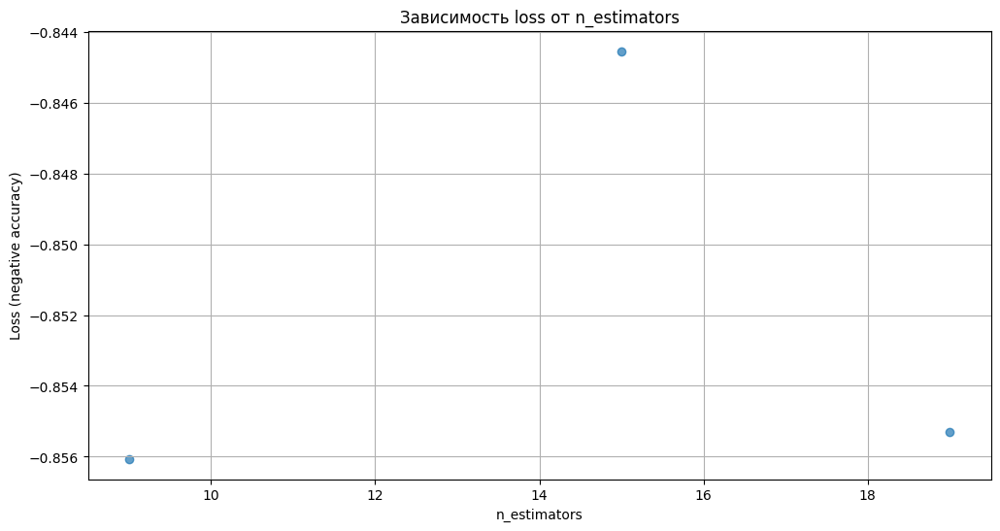

In [31]:
# Визуализация зависимости loss от n_estimators
plt.figure(figsize=(12, 6))
plt.scatter(results_df['n_estimators'], results_df['loss'], alpha=0.7)
plt.title('Зависимость loss от n_estimators')
plt.xlabel('n_estimators')
plt.ylabel('Loss (negative accuracy)')
plt.grid()
plt.show()

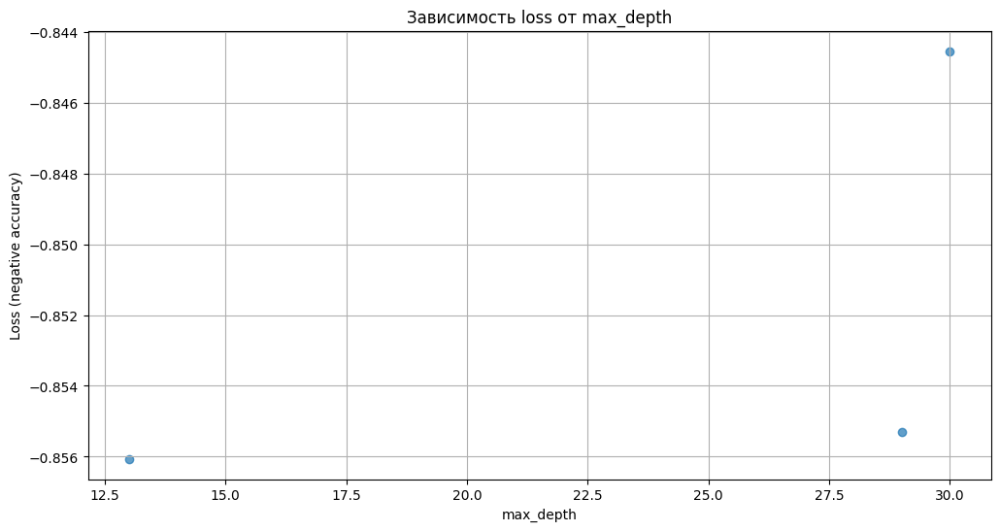

In [32]:
# Визуализация зависимости loss от max_depth
plt.figure(figsize=(12, 6))
plt.scatter(results_df['max_depth'], results_df['loss'], alpha=0.7)
plt.title('Зависимость loss от max_depth')
plt.xlabel('max_depth')
plt.ylabel('Loss (negative accuracy)')
plt.grid()
plt.show()

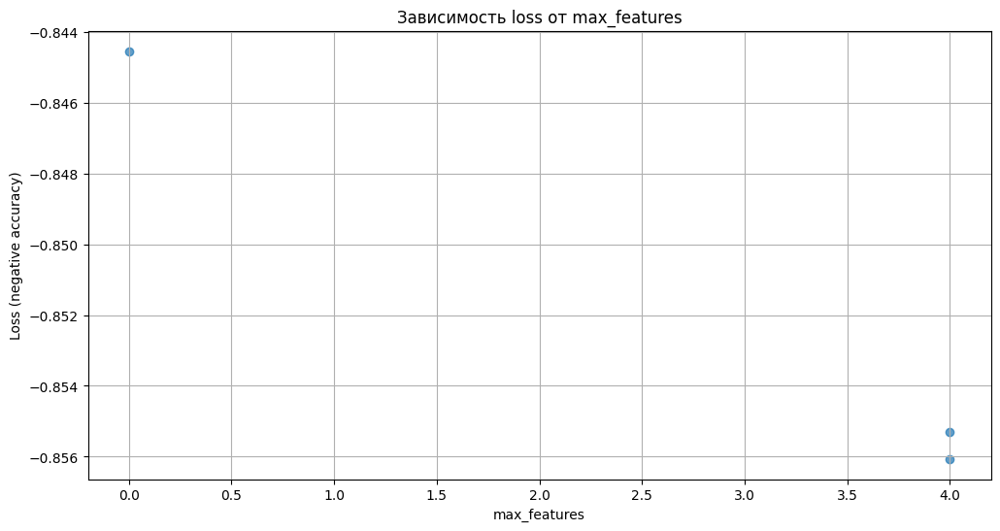

In [35]:
# Визуализация зависимости loss
plt.figure(figsize=(12, 6))
plt.scatter(results_df['max_features'], results_df['loss'], alpha=0.7)
plt.title('Зависимость loss от max_features')
plt.xlabel('max_features')
plt.ylabel('Loss (negative accuracy)')
plt.grid()
plt.show()

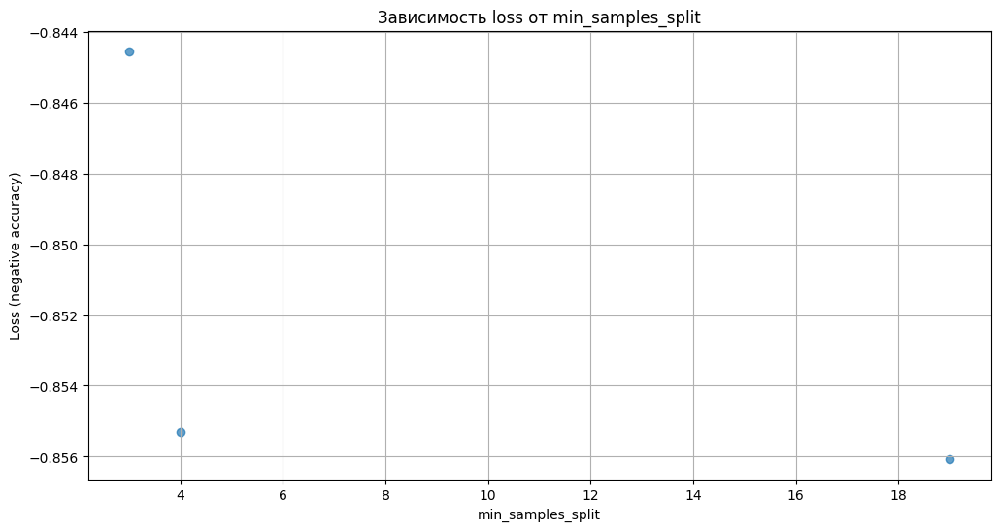

In [36]:
# Визуализация зависимости loss
plt.figure(figsize=(12, 6))
plt.scatter(results_df['min_samples_split'], results_df['loss'], alpha=0.7)
plt.title('Зависимость loss от min_samples_split')
plt.xlabel('min_samples_split')
plt.ylabel('Loss (negative accuracy)')
plt.grid()
plt.show()

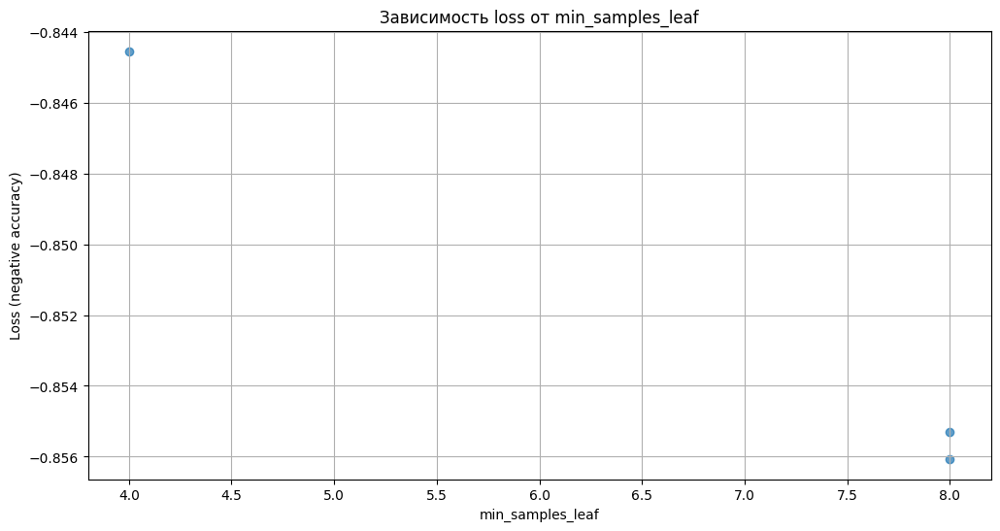

In [37]:
# Визуализация зависимости loss
plt.figure(figsize=(12, 6))
plt.scatter(results_df['min_samples_leaf'], results_df['loss'], alpha=0.7)
plt.title('Зависимость loss от min_samples_leaf')
plt.xlabel('min_samples_leaf')
plt.ylabel('Loss (negative accuracy)')
plt.grid()
plt.show()

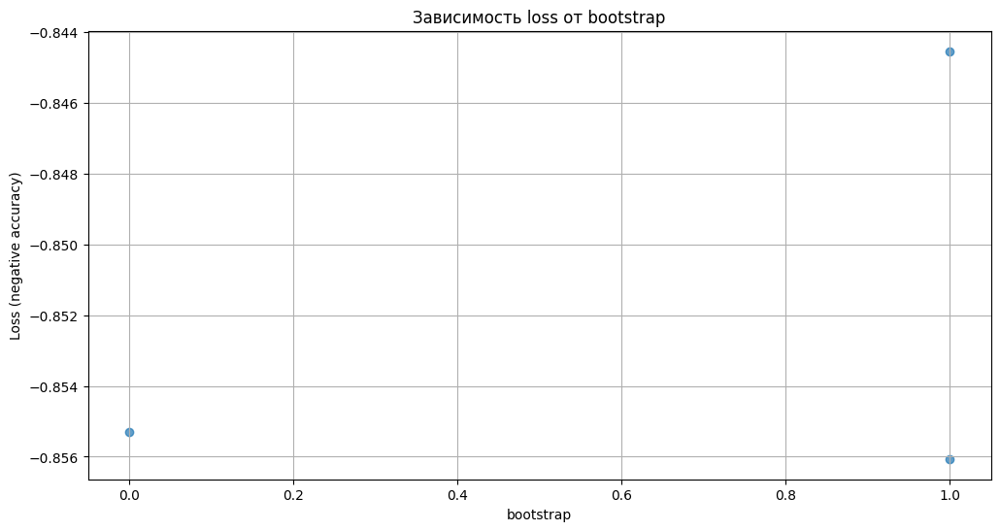

In [38]:
# Визуализация зависимости loss
plt.figure(figsize=(12, 6))
plt.scatter(results_df['bootstrap'], results_df['loss'], alpha=0.7)
plt.title('Зависимость loss от bootstrap')
plt.xlabel('bootstrap')
plt.ylabel('Loss (negative accuracy)')
plt.grid()
plt.show()